In [2]:
import geopandas as gpd
import re
from geofeather import from_geofeather
from geofeather import to_geofeather

In [1]:
from datetime import datetime
import matplotlib.pyplot as plt
import folium
from folium.plugins import HeatMap
from folium.plugins import MarkerCluster

from texttable import Texttable

In [3]:
from helper import *
from draw_maps import *
from main_logic import *
from debug import *
from loc_dict import *

In [4]:
pd.set_option('display.max_columns', None)

## Read data - Statewide

In [28]:
start_time = datetime.now()

parcel_whole = from_geofeather("data/ParcelData/statewide_parcel_data.feather")
address_whole = from_geofeather("data/AddressData/statewide_address_data.feather")

end_time = datetime.now()
print("Time cost: %.2fms" %((end_time - start_time).total_seconds() * 1000))

Time cost: 63827.98ms


### save data

In [10]:
to_geofeather(parcel_quincy, "./data/test_data/quincy_parcel.feather")
to_geofeather(address_quincy, "./data/test_data/quincy_address.feather")

## Read data - Test data

In [5]:
start_time = datetime.now()

parcel_quincy = from_geofeather("./data/test_data/quincy_parcel.feather")
address_quincy = from_geofeather("./data/test_data/quincy_address.feather")

end_time = datetime.now()
print("Time cost: %.2fms" %((end_time - start_time).total_seconds() * 1000))

Time cost: 889.72ms


### Read use code

In [34]:
state_use_code = gpd.read_file("data/state_use_codes_lookup_table/")

## Main process
### Clean addresses

In [29]:
address_whole_afterdrop = benchmark(clean_addresses, (address_whole))

Finished 10.0%
Finished 20.0%
Finished 30.0%
Finished 40.0%
Finished 50.0%
Finished 60.0%
Finished 70.0%
Finished 80.0%
Finished 90.0%
Finished 100.0%
Run time Cost is : 818327.58ms
Run time Cost is : 819294.8ms


In [33]:
print("Length before drop: {}".format(len(address_whole)))
print("Length after drop: {}".format(len(address_whole_afterdrop)))

Length before drop: 3656134
Length after drop: 3060858


### Filter out residential parcels

In [196]:
residential_usecode = generate_residential_usecode_set()

In [198]:
parcel_whole_residential = benchmark(filter_out_residential_parcels, (parcel_whole, residential_usecode))

Run time Cost is : 2985.24ms


In [199]:
print("Length before drop: {}".format(len(parcel_whole)))
print("Length after drop: {}".format(len(parcel_whole_residential)))

Length before drop: 2410194
Length after drop: 1970208


### Count by usecode

In [162]:
# Convert to gps standard
# parcel_qunicy_residential_conv = parcel_qunicy_residential.to_crs("EPSG:4326")

In [289]:
parcel_whole_count = benchmark(count_parcels, (parcel_whole_residential, usecode_dict))

Finished 10.0%
Finished 20.0%
Finished 30.0%
Finished 40.0%
Finished 50.0%
Finished 60.0%
Finished 70.0%
Finished 80.0%
Finished 90.0%
Finished 100.0%
Run time Cost is : 924934.49ms


In [290]:
parcel_whole_aftercount = benchmark(generate_gpd_dataframe, (parcel_whole_count, ["LOC_ID", "CITY", "STYLE_DESC", "COUNT_USECODE", "USE_CODE", "AREA_SQFEET"]))
parcel_whole_aftercount.head()

Run time Cost is : 2966.82ms


,LOC_ID,CITY,STYLE_DESC,COUNT_USECODE,USE_CODE,AREA_SQFEET,geometry
0,F_1000059_2574344,NANTUCKET,Conventional,1,1013,224724.827671,"POLYGON ((304473.772 785035.522, 304561.954 78..."
1,F_1000297_2570231,NANTUCKET,Cape Cod,1,1013,12416.709673,"POLYGON ((304919.264 783478.785, 304934.900 78..."
2,F_1000353_2571219,NANTUCKET,Gar/Apt Res,1,1010,11816.045758,"POLYGON ((304874.985 783779.869, 304930.948 78..."
3,F_1000375_2571671,NANTUCKET,Colonial,1,1010,12050.825624,"POLYGON ((304964.805 783902.527, 304955.351 78..."
4,F_1003504_2731628,DENNIS,COLONIAL,1,1010,880.215331,"POLYGON ((305896.875 832581.125, 305839.719 83..."


In [211]:
parcel_whole_aftercount = parcel_whole_aftercount.set_crs(parcel_whole.crs)

### Save parcel count data

In [216]:
address_whole_afterdrop = address_whole_afterdrop.reset_index()

In [217]:
# to_geofeather(parcel_whole_aftercount, "./data/state_data/parcel_whole_aftercount.feather")
# to_geofeather(address_whole_afterdrop, "./data/state_data/address_whole_afterdrop.feather")

### Sjoin

Main process

In [218]:
# Only need location info
address_whole_loc = gpd.GeoDataFrame(address_whole_afterdrop['geometry'])

In [221]:
sjoin_whole = benchmark(join_two_dataset, (address_whole_loc, parcel_whole_aftercount))

Run time Cost is : 340913.76ms


### Save sjoin result

In [223]:
# to_geofeather(sjoin_whole, "./data/state_data/sjoin_whole_no_process.feather")

### Merge two datasets

In [230]:
assumption_whole, anomalies_whole = benchmark(do_assumption, (sjoin_whole, parcel_confidence, countable_usecode))
sjoin_whole['ASSUMPTION'] = assumption_whole
sjoin_whole['IS_ANOMALY'] =  sjoin_whole['ASSUMPTION'] == -1

Run time Cost is : 55754.18ms


In [231]:
print("Anomalies rate: {}%".format(round(len(anomalies_whole) * 100 / len(assumption_whole), 2)))

Anomalies rate: 8.03%


### perform linear regression

In [264]:
from sklearn.linear_model import LinearRegression

In [263]:
anomalies_list = list(zip(*anomalies_whole))
reg = LinearRegression().fit([[x] for x in anomalies_list[0]], [[y] for y in anomalies_list[1]])

### Update anomaly values

In [308]:
update_anomaly(sjoin_whole, anomalies_whole, reg)

### Calculate density

In [285]:
sjoin_whole['DENSITY_SQFEET'] = sjoin_whole['AREA_SQFEET'] / sjoin_whole['ASSUMPTION']
sjoin_whole['DENSITY_SQMETER'] = sjoin_whole['DENSITY_SQFEET'] * 0.092903
sjoin_whole['DENSITY_ACRE'] = sjoin_whole['DENSITY_SQFEET'] / 43560

### Save final result

In [286]:
to_geofeather(sjoin_whole, "./data/state_data/sjoin_whole.feather")

### Draw validation map

In [306]:
benchmark(draw_validation_map, (sjoin_whole, "BOSTON", "./maps/whole_state_"))

,index_left,LOC_ID,STYLE_DESC,COUNT_USECODE,USE_CODE,AREA_SQFEET,geometry,ADD_COUNT,ASSUMPTION,IS_ANOMALY,DENSITY_SQFEET,DENSITY_SQMETER,CITY
0,NaN,F_1000059_2574344,Conventional,1,1013,224724.827671,"POLYGON ((304473.772 785035.522, 304561.954 78...",1,1.0,False,224724.827671,20877.610665,NANTUCKET
1,NaN,F_1000297_2570231,Cape Cod,1,1013,12416.709673,"POLYGON ((304919.264 783478.785, 304934.900 78...",1,1.0,False,12416.709673,1153.549579,NANTUCKET
2,NaN,F_1000353_2571219,Gar/Apt Res,1,1010,11816.045758,"POLYGON ((304874.985 783779.869, 304930.948 78...",1,1.0,False,11816.045758,1097.746099,NANTUCKET
3,NaN,F_1000375_2571671,Colonial,1,1010,12050.825624,"POLYGON ((304964.805 783902.527, 304955.351 78...",1,1.0,False,12050.825624,1119.557853,NANTUCKET
4,386563.0,F_1003504_2731628,COLONIAL,1,1010,880.215331,"POLYGON ((305896.875 832581.125, 305839.719 83...",1,1.0,False,880.215331,81.774645,DENNIS


### Draw anomaly map

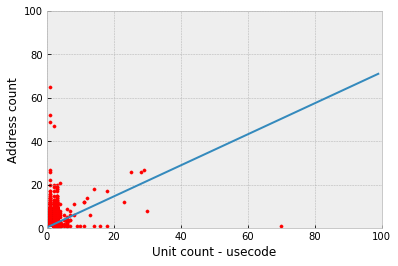

In [261]:
generate_distribution_map(anomalies_list[0], anomalies_list[1], ["Unit count - usecode", "Address count"], filename="./pics/Output/whole-state-anomaly.png", xlim=[0, 100], ylim=[0,100], reg = reg)

# Bug and test area

### Bug 1 -duplicates

In [441]:
## Duplicates!
## TODO: Problem, different address for same building
## TODO: How to solve?
sjoin_not_count[sjoin_not_count['LOC_ID'] == "F_784455_2921099"]

,index,CENTROID_ID,FULL_NUMBER_STANDARDIZED,ADDRESS_NUMBER_PREFIX,ADDRESS_NUMBER,ADDRESS_NUMBER_SUFFIX,ADDRESS_NUMBER_2_PREFIX,ADDRESS_NUMBER_2,ADDRESS_NUMBER_2_SUFFIX,STREET_NAME,FLOOR,UNIT,MASTER_ADDRESS_ID,STREET_NAME_ID,REL_LOC,SITE_ID,BUILDING_NAME,GEOGRAPHIC_TOWN_ID,COMMUNITY_ID,COMMUNITY_NAME,GEOGRAPHIC_TOWN,POSTCODE,PC_NAME,COUNTY,STATE,geometry,index_right,LOC_ID,STYLE_DESC,count_by_usecode,usecode_str,area
29168,2156026,M_239101_890354,243,None,243.0,None,None,NaN,None,NORTH CENTRAL AVENUE,None,1,4280998,180076,None,NaN,None,243.0,261,QUINCY,QUINCY,02170,QUINCY,NORFOLK,MA,POINT (-71.02608 42.26267),4208.0,F_784455_2921099,2 Fam Conver,2.0,1040,800.808293
29307,2156425,M_239101_890354,247,None,247.0,None,None,NaN,None,NORTH CENTRAL AVENUE,None,1,4385368,180076,None,NaN,None,243.0,261,QUINCY,QUINCY,02170,QUINCY,NORFOLK,MA,POINT (-71.02608 42.26267),4208.0,F_784455_2921099,2 Fam Conver,2.0,1040,800.808293
29309,2156427,M_239101_890354,247,None,247.0,None,None,NaN,None,NORTH CENTRAL AVENUE,None,2,4046650,180076,None,NaN,None,243.0,261,QUINCY,QUINCY,02170,QUINCY,NORFOLK,MA,POINT (-71.02608 42.26267),4208.0,F_784455_2921099,2 Fam Conver,2.0,1040,800.808293


### Bug 2 - crazy large area

In [444]:
sjoin_not_count[sjoin_not_count['LOC_ID'] == "F_778027_2915235"]

,index,CENTROID_ID,FULL_NUMBER_STANDARDIZED,ADDRESS_NUMBER_PREFIX,ADDRESS_NUMBER,ADDRESS_NUMBER_SUFFIX,ADDRESS_NUMBER_2_PREFIX,ADDRESS_NUMBER_2,ADDRESS_NUMBER_2_SUFFIX,STREET_NAME,FLOOR,UNIT,MASTER_ADDRESS_ID,STREET_NAME_ID,REL_LOC,SITE_ID,BUILDING_NAME,GEOGRAPHIC_TOWN_ID,COMMUNITY_ID,COMMUNITY_NAME,GEOGRAPHIC_TOWN,POSTCODE,PC_NAME,COUNTY,STATE,geometry,index_right,LOC_ID,STYLE_DESC,count_by_usecode,usecode_str,area
14794,2121091,M_237147_888528,200,None,200.0,None,None,NaN,None,QUARRY HILLS DRIVE,None,None,4459649,180258,None,NaN,1,243.0,261,QUINCY,QUINCY,02169,QUINCY,NORFOLK,MA,POINT (-71.04988 42.24633),0.0,F_778027_2915235,Apartments,-1.0,1120,33452.33985
24712,2141620,M_237191_888624,200,None,200.0,None,None,NaN,None,QUARRY HILLS DRIVE,None,None,4459650,180258,None,NaN,2,243.0,261,QUINCY,QUINCY,02169,QUINCY,NORFOLK,MA,POINT (-71.04934 42.24720),0.0,F_778027_2915235,Apartments,-1.0,1120,33452.33985


## Use code

In [35]:
filtered_use_code_0 = state_use_code[flter_list(state_use_code['USE_CODE'], pattern="^0")]
filtered_use_code_1 = state_use_code[flter_list(state_use_code['USE_CODE'], pattern="^1")]
filtered_use_code_9 = state_use_code[flter_list(state_use_code['USE_CODE'], pattern="^9")]

### USE CODE - Starts with 0
Classes

In [14]:
print_use_code_classes(filtered_use_code_0)

+----------+---------------------------------------------------+-------+-------+
| USE_CODE | USE_DESC                                          | COUNT | INDEX |
+----------+---------------------------------------------------+-------+-------+
| 000      | Use code not known or nor provided.               | 1     | 1     |
+----------+---------------------------------------------------+-------+-------+
| 007      | Mixed Use                                         | 1     | 2     |
+----------+---------------------------------------------------+-------+-------+
| 011      | Mixed Use-day care & residential                  | 1     | 3     |
+----------+---------------------------------------------------+-------+-------+
| 012      | Other                                             | 3     | 4     |
+----------+---------------------------------------------------+-------+-------+
| 013      | Mixed Use (Primarily Residential, some            | 1     | 5     |
|          | Commercial)    

Details

In [15]:
print_by_usecode(filtered_use_code_0)

+----------+---------------------------------------------------+-------+-------+
| USE_CODE | USE_DESC                                          | COUNT | INDEX |
+----------+---------------------------------------------------+-------+-------+
| 000      | Use code not known or nor provided.               | 1     | 1     |
+----------+---------------------------------------------------+-------+-------+
| 007      | Mixed Use                                         | 1     | 2     |
+----------+---------------------------------------------------+-------+-------+
| 0101     | Single Fam                                        | 100   | 3     |
+----------+---------------------------------------------------+-------+-------+
| 0102     | Condo                                             | 8     | 4     |
+----------+---------------------------------------------------+-------+-------+
| 0103     | Mobile Hom                                        | 13    | 5     |
+----------+----------------

### Test area

In [50]:
def check_desc(desc_l, s):
    for desc in desc_l:
        if desc in s: return True
    return False

In [84]:
def write_test_log(filename, s):
    with open(filename, "w") as f:
        f.write(s)

In [149]:
def generate_ratio(usecode_df, keywords):
    length = len(usecode_df)
    t = Texttable()
    t.add_row(["Keywords", "Ratio"])
    for k in keywords:
        temp_len = len(usecode_df[[k in v.lower() for v in usecode_df['USE_DESC']]])
        t.add_row([k, str(0 if length == 0 else round(temp_len / length, 2))])
    return t.draw()

In [152]:
def check_single_usecode(usecode_df, usecode, keywords=[], is_class=False, print_all_desc=True, write_file=False):
    filename_ = "./note/proof/proof_" + usecode + ".txt"
    end_index = 4
    if is_class: end_index = 3

    table = print_usecode_subclass(usecode_df, usecode, is_class=is_class, print_all_desc=True)

    test_usecode = usecode_df[[uc[:end_index] == usecode for uc in usecode_df['USE_CODE']]]
    # test_useocde_contain_keyword = test_usecode[[check_desc(keyword, v.lower()) for v in test_usecode['USE_DESC']]]

    ratio = generate_ratio(test_usecode, keywords)
    # ratio = "\nKeyword: {}, ratio: {}".format(keywords, len(test_useocde_contain_keyword)/len(test_usecode))
    print(ratio)

    if write_file: write_test_log(filename_, table + ratio)

In [181]:
test_keywords = ["single fam", "single-fam", "1 fam", "two fam", "two-fam", "2 fam", "three fam", "three_fam", "3 fam", "condo", "apt", "apartment"]
check_single_usecode(filtered_use_code_9, "945", test_keywords, is_class=True, print_all_desc=True, write_file=True)

+----------+---------+-----------------------------------------+-------+-------+
| USE_CODE | TOWN_ID | USE_DESC                                | COUNT | INDEX |
+----------+---------+-----------------------------------------+-------+-------+
| 945      | 0       | Affiliated Housing (Educational         | 1     | 1     |
|          |         | Private)                                |       |       |
+----------+---------+-----------------------------------------+-------+-------+
| 9450     | 0       | Affiliated Housing (Educational         | 1     | 2     |
|          |         | Private)                                |       |       |
+----------+---------+-----------------------------------------+-------+-------+
| 9451     | 49      | Affiliated Housing                      | 2     | 3     |
+----------+---------+-----------------------------------------+-------+-------+
| 9451     | 176     | Dormitory                               | 2     | 4     |
+----------+---------+------

### USE CODE - Starts with 1
Classes

In [16]:
print_use_code_classes(filtered_use_code_1)

+----------+---------------------------------------------------+-------+-------+
| USE_CODE | USE_DESC                                          | COUNT | INDEX |
+----------+---------------------------------------------------+-------+-------+
| 101      | Single Family Residential                         | 1     | 1     |
+----------+---------------------------------------------------+-------+-------+
| 102      | Residential Condominium                           | 1     | 2     |
+----------+---------------------------------------------------+-------+-------+
| 103      | Mobile Home (includes mobile home park land)      | 1     | 3     |
+----------+---------------------------------------------------+-------+-------+
| 104      | Two-Family Residential                            | 1     | 4     |
+----------+---------------------------------------------------+-------+-------+
| 105      | Three-Family Residential                          | 1     | 5     |
+----------+----------------

Details

In [17]:
print_by_usecode(filtered_use_code_1)

+----------+---------------------------------------------------+-------+-------+
| USE_CODE | USE_DESC                                          | COUNT | INDEX |
+----------+---------------------------------------------------+-------+-------+
| 1000     | Unknown [IMPUTED]                                 | 2     | 1     |
+----------+---------------------------------------------------+-------+-------+
| 1001     | Planned Development                               | 1     | 2     |
+----------+---------------------------------------------------+-------+-------+
| 101      | Single Family Residential                         | 1     | 3     |
+----------+---------------------------------------------------+-------+-------+
| 1010     | Single Family Residential                         | 1     | 4     |
+----------+---------------------------------------------------+-------+-------+
| 1011     | Single Family - NL                                | 23    | 5     |
+----------+----------------

### USE CODE - Starts with 9
Classes

In [18]:
print_use_code_classes(filtered_use_code_9)

+----------+---------------------------------------------------+-------+-------+
| USE_CODE | USE_DESC                                          | COUNT | INDEX |
+----------+---------------------------------------------------+-------+-------+
| 900      | United States Government                          | 1     | 1     |
+----------+---------------------------------------------------+-------+-------+
| 901      | (formerly Commonwealth of Massachusetts.  Removed | 1     | 2     |
|          | June 2009.)                                       |       |       |
+----------+---------------------------------------------------+-------+-------+
| 902      | (formerly Counties.  Removed June 2009.)          | 1     | 3     |
+----------+---------------------------------------------------+-------+-------+
| 903      | (formerly Municipalities/Districts.  Removed June | 1     | 4     |
|          | 2009.)                                            |       |       |
+----------+----------------

Details

In [19]:
print_by_usecode(filtered_use_code_9)

+----------+---------------------------------------------------+-------+-------+
| USE_CODE | USE_DESC                                          | COUNT | INDEX |
+----------+---------------------------------------------------+-------+-------+
| 900      | United States Government                          | 1     | 1     |
+----------+---------------------------------------------------+-------+-------+
| 9000     | United States Government                          | 1     | 2     |
+----------+---------------------------------------------------+-------+-------+
| 9001     | US GOVERNMENT - C                                 | 4     | 3     |
+----------+---------------------------------------------------+-------+-------+
| 9002     | US Govt C                                         | 2     | 4     |
+----------+---------------------------------------------------+-------+-------+
| 9003     | US Government                                     | 1     | 5     |
+----------+----------------

### Using statewise dataset

In [499]:
mix_use_set = set([pad_str(str(v)) for v in range(100)])

In [507]:
for loc_id_, df_ in parcel_whole[[v[:3] in mix_use_set if v and len(v) > 3 else False for v in parcel_whole["USE_CODE"]]].groupby("LOC_ID"):
    if len(df_) > 1: print(loc_id_)

F_1019873_2734500
F_1040670_2560209
F_1040920_2561093
F_1041449_2567345
F_1042691_2565407
F_702008_2819778
F_704700_3055477
F_706491_3058140
F_707670_3055426
F_842054_2823599
M_251576_880011
M_257137_830566
M_269154_928699
M_281180_794378


In [592]:
def print_by_keywords(df, cnt=10, keywords=["LOC_ID", "STYLE", "USE_CODE", "TOWN_ID", "SITE_ADDR"]):
    print("There are {} records".format(len(df)))
    print("-" * 100)
    
    t = Texttable()
    t.set_cols_dtype(['t'] * len(keywords))
    t.add_row(keywords)

    count = 0
    df = df.sort_values('TOWN_ID')
    for i in range(len(df.index)):
        t.add_row([df.iloc[i][k] for k in keywords])
        count += 1
        if count > cnt: break
    
    print(t.draw())

In [593]:
# Debug code 0101
# Debug code 9592 - different  style, same code
# Debug code 0310
# print_by_keywords(parcel_whole[parcel_whole["LOC_ID"] == "F_1040670_2560209"], cnt=10)
print_by_keywords(parcel_whole[parcel_whole["USE_CODE"] == "9591"], cnt=40)

There are 177 records
----------------------------------------------------------------------------------------------------
+------------------+----------------+----------+---------+---------------------+
| LOC_ID           | STYLE          | USE_CODE | TOWN_ID | SITE_ADDR           |
+------------------+----------------+----------+---------+---------------------+
| M_246048_956286  | Vacant Land    | 9591     | 7       | 0 KEYSER WAY        |
+------------------+----------------+----------+---------+---------------------+
| F_853134_2786798 | None           | 9591     | 52      | 73 MAIN ST          |
+------------------+----------------+----------+---------+---------------------+
| F_864575_2763976 | None           | 9591     | 52      | 1-44 COPPER LANTERN |
|                  |                |          |         | LN                  |
+------------------+----------------+----------+---------+---------------------+
| F_857105_2783397 | None           | 9591     | 52      | 3 SOUTH 

### Problem style do not match with use code description
- code 9592

In [517]:
# Debug use F_1019873_2734500
# Debug use F_1040670_2560209 - One building with different use code
parcel_whole[parcel_whole["LOC_ID"] == "M_281180_794378"].head()

,MAP_PAR_ID,LOC_ID,POLY_TYPE,MAP_NO,SOURCE,PLAN_ID,LAST_EDIT,BND_CHK,NO_MATCH,TOWN_ID,PROP_ID,BLDG_VAL,LAND_VAL,OTHER_VAL,TOTAL_VAL,FY,LOT_SIZE,LS_DATE,LS_PRICE,USE_CODE,SITE_ADDR,ADDR_NUM,FULL_STR,LOCATION,CITY,ZIP,OWNER1,OWN_ADDR,OWN_CITY,OWN_STATE,OWN_ZIP,OWN_CO,LS_BOOK,LS_PAGE,REG_ID,ZONING,YEAR_BUILT,BLD_AREA,UNITS,RES_AREA,STYLE,NUM_ROOMS,LOT_UNITS,STORIES,SHAPE_AREA,SHAPE_LEN,geometry
96630,21_6_21,M_281180_794378,FEE,21,ASSESS,None,20120119,None,N,89,21_6_34,208400,0,0,208400,2021,0.0,19990430,80000,3221,243 EDGARTOWN VH RD #4 (A4),243,EDGARTOWN VH RD,4 (A4),EDGARTOWN,None,WALLACE MICHAEL--TRS,PO BOX 1267,OAK BLUFFS,MA,02557,USA,0763,0617,None,B11,1987,1052,0,570,Retail Condo,0,Acres,0,4973.024495,364.325261,"POLYGON ((281143.992 794363.232, 281151.208 79..."
96631,21_6_21,M_281180_794378,FEE,21,ASSESS,None,20120119,None,N,89,21_6_21_MAIN,0,0,0,0,2021,0.0,20000101,0,995,243-247 EDGARTOWN VH RD UNIT,243-247,EDGARTOWN VH RD UNIT,None,EDGARTOWN,None,None,None,None,None,None,None,0,0,None,None,1987,0,10,0,Retail Condo,0,Acres,0,4973.024495,364.325261,"POLYGON ((281143.992 794363.232, 281151.208 79..."
412491,21_6_21,M_281180_794378,FEE,21,ASSESS,None,20120119,None,N,89,21_6_33,267800,0,0,267800,2021,0.0,20150806,300000,031A,243 EDGARTOWN VH RD #3 (A3),243,EDGARTOWN VH RD,3 (A3),EDGARTOWN,None,PATTAVINA SEBASTIAN M &,PO BOX 1232,EDGARTOWN,MA,02539,USA,1383,0219,None,B11,1987,889,0,796,Mix Use Condo,0,Acres,0,4973.024495,364.325261,"POLYGON ((281143.992 794363.232, 281151.208 79..."
412492,21_6_21,M_281180_794378,FEE,21,ASSESS,None,20120119,None,N,89,21_6_32,302900,0,0,302900,2021,0.0,20151124,350000,031A,243 EDGARTOWN VH RD #2 (A2),243,EDGARTOWN VH RD,2 (A2),EDGARTOWN,None,PATTAVINA SEBASTIAN M &,PO BOX 1232,EDGARTOWN,MA,02539,USA,1391,0853,None,B11,1987,1052,0,932,Mix Use Condo,0,Acres,0,4973.024495,364.325261,"POLYGON ((281143.992 794363.232, 281151.208 79..."
413152,21_6_21,M_281180_794378,FEE,21,ASSESS,None,20120119,None,N,89,21_6_38,322000,0,0,322000,2021,0.0,19970514,65000,031A,247 EDGARTOWN VH RD #8 (B8),247,EDGARTOWN VH RD,8 (B8),EDGARTOWN,None,BARNES MICHAEL ROBERT,PO BOX 4450,VINEYARD HAVEN,MA,02568,USA,0700,0497,None,B11,1987,889,0,796,Mix Use Condo,0,Acres,0,4973.024495,364.325261,"POLYGON ((281143.992 794363.232, 281151.208 79..."


# How to process user description?
## Use NLP?

In [583]:
# Debug use 031A
print_usecode_subclass(filtered_use_code_9, "959", is_class=True, print_all_desc=True)

+----------+---------+-----------------------------------------+-------+-------+
| USE_CODE | TOWN_ID | USE_DESC                                | COUNT | INDEX |
+----------+---------+-----------------------------------------+-------+-------+
| 959      | 0       | Housing, Other (Charitable Org.)        | 1     | 1     |
+----------+---------+-----------------------------------------+-------+-------+
| 9590     | 0       | Housing, Other (Charitable Org.)        | 1     | 2     |
+----------+---------+-----------------------------------------+-------+-------+
| 9591     | 7       | Housing, Other                          | 22    | 3     |
+----------+---------+-----------------------------------------+-------+-------+
| 9591     | 52      | Tax Exempt                              | 22    | 4     |
+----------+---------+-----------------------------------------+-------+-------+
| 9591     | 110     | Housing Other R                         | 22    | 5     |
+----------+---------+------

## Test section, Garbage for now

In [21]:
def construct_df_map(df, keyword="COMMUNITY_NAME"):
    m = {}
    for name, df in df.groupby(keyword):
        m.update({name: df})
    return m

In [22]:
address_cityname_df_map = construct_df_map(address_whole)

In [24]:
def join_two_dataset_state_map(parcel_df, address_df_map, keyword="CITY"):
    start_time = datetime.now()
    
    m = {}
    for name, p_df in parcel_df.groupby(keyword):
        start_time_2 = datetime.now()

        a_df = address_df_map[address_df_map["COMMUNITY_NAME"] == name]
        join_two_dataset_map(a_df, p_df, m, "LOC_ID")
        print("%s, cost: %.2dms" %(name, (datetime.now() - start_time_2).total_seconds() * 1000))
        print("res length: %d" %(len(m)))

    end_time = datetime.now()
    print("Time cost: %.2fms" %((end_time - start_time).total_seconds() * 1000))
    return m


In [110]:
gdf = gpd.GeoDataFrame()
print(gdf.empty)

True


In [101]:
parcel_whole.crs

<Projected CRS: EPSG:26986>
Name: NAD83 / Massachusetts Mainland
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: United States (USA) - Massachusetts onshore - counties of Barnstable; Berkshire; Bristol; Essex; Franklin; Hampden; Hampshire; Middlesex; Norfolk; Plymouth; Suffolk; Worcester.
- bounds: (-73.5, 41.46, -69.86, 42.89)
Coordinate Operation:
- name: SPCS83 Massachusetts Mainland zone (meters)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [18]:
def join_state_data(address_whole, parcel_whole):
    start_time = datetime.now()
    res = join_two_dataset(address_whole, parcel_whole, "LOC_ID")
    end_time = datetime.now()
    print("Time cost: %.2fms" %((end_time - start_time).total_seconds() * 1000))
    return res

In [20]:
joined_state_1 = join_state_data(address_whole, parcel_whole)

Time cost: 4064548.05ms


In [23]:
to_geofeather(joined_state_1.reset_index(), "./data/processed.feather")

In [24]:
len(joined_state_1.index)

1834283

In [27]:
joined_state_1_conv = joined_state_1.to_crs("EPSG:4326")
mass_heat_map = draw_debug_heatmap(joined_state_1_conv.geometry, joined_state_1_conv.ADD_COUNT, 12)
mass_heat_map.save("./maps/mass_heatmap.html")

In [ ]:
joined_state_2 = join_two_dataset_state_map(parcel_whole, address_whole)

ABINGTON, cost: 2718ms
res length: 4475
ACTON, cost: 3823ms
res length: 10786
ACUSHNET, cost: 2239ms
res length: 14434
ADAMS, cost: 1884ms
res length: 17384
AGAWAM, cost: 5109ms
res length: 25982
ALFORD, cost: 363ms
res length: 26321
AMESBURY, cost: 3005ms
res length: 31120
AMHERST, cost: 3311ms
res length: 36022
ANDOVER, cost: 6095ms
res length: 45979
AQUINNAH, cost: 486ms
res length: 46504
ARLINGTON, cost: 7261ms
res length: 58019
ASHBURNHAM, cost: 1697ms
res length: 60626
ASHBY, cost: 851ms
res length: 61827
ASHFIELD, cost: 648ms
res length: 62639
ASHLAND, cost: 2706ms
res length: 66887
ATHOL, cost: 2510ms
res length: 70856
ATTLEBORO, cost: 7412ms
res length: 82810
AUBURN, cost: 3524ms
res length: 88632
AVON, cost: 1063ms
res length: 90218
AYER, cost: 1509ms
res length: 92402
BARNSTABLE, cost: 2827ms
res length: 94399
BARRE, cost: 1337ms
res length: 96268
BECKET, cost: 1337ms
res length: 98088
BEDFORD, cost: 2585ms
res length: 102232
BELCHERTOWN, cost: 3106ms
res length: 107138
BELL

In [23]:
address_whole.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 3656134 entries, 0 to 3656133
Data columns (total 25 columns):
 #   Column                    Dtype   
---  ------                    -----   
 0   CENTROID_ID               object  
 1   FULL_NUMBER_STANDARDIZED  object  
 2   ADDRESS_NUMBER_PREFIX     object  
 3   ADDRESS_NUMBER            float64 
 4   ADDRESS_NUMBER_SUFFIX     object  
 5   ADDRESS_NUMBER_2_PREFIX   object  
 6   ADDRESS_NUMBER_2          float64 
 7   ADDRESS_NUMBER_2_SUFFIX   object  
 8   STREET_NAME               object  
 9   FLOOR                     object  
 10  UNIT                      object  
 11  MASTER_ADDRESS_ID         int64   
 12  STREET_NAME_ID            int64   
 13  REL_LOC                   object  
 14  SITE_ID                   float64 
 15  BUILDING_NAME             object  
 16  GEOGRAPHIC_TOWN_ID        float64 
 17  COMMUNITY_ID              int64   
 18  COMMUNITY_NAME            object  
 19  GEOGRAPHIC_TOWN           object  

### Using Quincy dataset

In [12]:
#Merge using goepandas.sjoin
start_time = datetime.now()

joined_test_quincy_2k = gpd.sjoin(address_quincy, parcel_quincy_test_2k, how="inner", op="within")
# newQuincy = gpd.sjoin(address_quincy, parcel_quincy[['LOC_ID', 'geometry']], how='left', op='within')
# joined_test = gpd.sjoin(parcel_quincy_converted, address_quincy_converted, how="inner", op="within")

end_time = datetime.now()
print("Time cost: %.2fms" %((end_time - start_time).total_seconds() * 1000))

Time cost: 291.07ms


In [14]:
parcel_quincy_test_2k_conv = parcel_quincy_test_2k.to_crs("EPSG:4326")
joined_test_quincy_2k_conv = joined_test_quincy_2k.to_crs("EPSG:4326")

In [19]:
joined_test_quincy_2k_conv.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 3458 entries, 2120189 to 2225326
Data columns (total 38 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   CENTROID_ID               3458 non-null   object  
 1   FULL_NUMBER_STANDARDIZED  3458 non-null   object  
 2   ADDRESS_NUMBER_PREFIX     1 non-null      object  
 3   ADDRESS_NUMBER            3458 non-null   float64 
 4   ADDRESS_NUMBER_SUFFIX     22 non-null     object  
 5   ADDRESS_NUMBER_2_PREFIX   0 non-null      object  
 6   ADDRESS_NUMBER_2          0 non-null      float64 
 7   ADDRESS_NUMBER_2_SUFFIX   0 non-null      object  
 8   STREET_NAME               3458 non-null   object  
 9   FLOOR                     0 non-null      object  
 10  UNIT                      1167 non-null   object  
 11  MASTER_ADDRESS_ID         3458 non-null   int64   
 12  STREET_NAME_ID            3458 non-null   int64   
 13  REL_LOC                   1 non

In [16]:
test_m_1 = draw_debug_plot(joined_test_quincy_2k_conv.geometry, parcel_quincy_test_2k_conv.geometry)

In [18]:
test_m_1.save("maps/test_m_1.html")

In [65]:
test_drop = parcel_quincy_2k.drop_duplicates(["MAP_PAR_ID"])

In [67]:
test_drop.MAP_PAR_ID.value_counts()

5190-22-A       1
5012-10-555     1
5056-61-760     1
4001-27-        1
6154-62-42      1
               ..
1168-44-C       1
6018-25-A       1
1033-20-76      1
4125-17-14      1
6017B-26-235    1
Name: MAP_PAR_ID, Length: 1308, dtype: int64

In [32]:
parcel_quincy.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 24247 entries, 207 to 2406350
Data columns (total 47 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   MAP_PAR_ID  17102 non-null  object  
 1   LOC_ID      24247 non-null  object  
 2   POLY_TYPE   24247 non-null  object  
 3   MAP_NO      24241 non-null  object  
 4   SOURCE      24247 non-null  object  
 5   PLAN_ID     0 non-null      object  
 6   LAST_EDIT   24247 non-null  int64   
 7   BND_CHK     143 non-null    object  
 8   NO_MATCH    24247 non-null  object  
 9   TOWN_ID     24247 non-null  int64   
 10  PROP_ID     24247 non-null  object  
 11  BLDG_VAL    24247 non-null  int64   
 12  LAND_VAL    24247 non-null  int64   
 13  OTHER_VAL   24247 non-null  int64   
 14  TOTAL_VAL   24247 non-null  int64   
 15  FY          24247 non-null  int64   
 16  LOT_SIZE    24247 non-null  float64 
 17  LS_DATE     24247 non-null  object  
 18  LS_PRICE    24247 non-null  int64 

In [59]:
parcel_quincy_2k = parcel_quincy[:2000]

In [68]:
#Merge using goepandas.sjoin
start_time = datetime.now()

# joined_quincy_2k = gpd.sjoin(address_quincy, parcel_quincy_2k, how="inner", op="within")
joined_quincy_2k = gpd.sjoin(address_quincy, test_drop, how="inner", op="within")

end_time = datetime.now()
print("Time cost: %.2fms" %((end_time - start_time).total_seconds() * 1000))

Time cost: 266.06ms


In [80]:
joined_quincy_2k_count = count_address(joined_quincy_2k)

In [69]:
joined_quincy_2k.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 5137 entries, 2065885 to 2303588
Data columns (total 72 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   CENTROID_ID               5137 non-null   object  
 1   FULL_NUMBER_STANDARDIZED  5137 non-null   object  
 2   ADDRESS_NUMBER_PREFIX     1 non-null      object  
 3   ADDRESS_NUMBER            5137 non-null   float64 
 4   ADDRESS_NUMBER_SUFFIX     17 non-null     object  
 5   ADDRESS_NUMBER_2_PREFIX   0 non-null      object  
 6   ADDRESS_NUMBER_2          0 non-null      float64 
 7   ADDRESS_NUMBER_2_SUFFIX   0 non-null      object  
 8   STREET_NAME               5137 non-null   object  
 9   FLOOR                     0 non-null      object  
 10  UNIT                      3233 non-null   object  
 11  MASTER_ADDRESS_ID         5137 non-null   int64   
 12  STREET_NAME_ID            5137 non-null   int64   
 13  REL_LOC                   0 non

In [83]:
joined_quincy_2k_count_conv = joined_quincy_2k_count.to_crs("EPSG:4326")
test_drop_conv = test_drop.to_crs("EPSG:4326")

In [91]:
test_m_2 = draw_debug_plot(joined_quincy_2k_count_conv.geometry, test_drop_conv.geometry, joined_quincy_2k_count_conv.ADD_COUNT)
test_m_2.save("./maps/test_m_2.html")

In [100]:
parcel_quincy_conv = parcel_quincy.to_crs("EPSG:4326")
test_m_3 = draw_debug_plot([], parcel_quincy_conv.geometry)
test_m_3.save("./maps/quincy_parcel.html")

In [35]:
len(address_quincy[address_quincy["CENTROID_ID"] == "M_242902_889211"])

410

In [53]:
observe_data = parcel_quincy_2k[parcel_quincy_2k["MAP_PAR_ID"] == "4032-20-16MGT"]

In [50]:
# count polygons with same MAP_PAR_ID
def count_polygons(polygons):
    p = None
    count = 1
    for polygon in polygons:
        if not p:
            p = polygon
            continue
        if p != polygon:
            p = polygon
            count += 1
    print(count)

In [54]:
count_polygons(observe_data.geometry)

1


### Whole quincy

In [114]:
quincy_join = join_two_dataset(address_quincy, parcel_quincy)

Time cost: 2224.01ms


In [118]:
calculate_coverage(quincy_join, parcel_quincy.drop_duplicates("MAP_PAR_ID"))

97.79

In [117]:
quincy_join.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 15315 entries, 1002-1-103 to 6171-24-ML20B
Data columns (total 72 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   CENTROID_ID               15315 non-null  object  
 1   FULL_NUMBER_STANDARDIZED  15315 non-null  object  
 2   ADDRESS_NUMBER_PREFIX     5 non-null      object  
 3   ADDRESS_NUMBER            15315 non-null  float64 
 4   ADDRESS_NUMBER_SUFFIX     106 non-null    object  
 5   ADDRESS_NUMBER_2_PREFIX   0 non-null      object  
 6   ADDRESS_NUMBER_2          0 non-null      float64 
 7   ADDRESS_NUMBER_2_SUFFIX   0 non-null      object  
 8   STREET_NAME               15315 non-null  object  
 9   FLOOR                     0 non-null      object  
 10  UNIT                      2037 non-null   object  
 11  MASTER_ADDRESS_ID         15315 non-null  int64   
 12  STREET_NAME_ID            15315 non-null  int64   
 13  REL_LOC                   

In [119]:
quincy_join_conv = quincy_join.to_crs("EPSG:4326")

In [25]:
quincy_heat_map = draw_debug_heatmap(joined_state_1.geometry, joined_state_1.ADD_COUNT, 15)
quincy_heat_map.save("./maps/mass_heatmap.html")